In [4]:
import numpy as np
from Utils import P_X, CanonicalUnits, GravitationalParameters
import spiceypy as spy
from scipy.integrate import nquad
from typing import Dict, Set, Optional, Union, Tuple
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
%load_ext autoreload 
%autoreload 2

### Testing Different Numerical Methods to Solve P_X integration

In [5]:
cu = CanonicalUnits()
deg = cu.deg
AU_m = cu.AU_m #m
M_sun = cu.M_sun
G = cu.G # m^3 / (kg s^2)
year = cu.year #s
mu = cu.mu
grav_params = GravitationalParameters(mu=mu)

#### Gauss–Kronrod (nquad)
(QUADPACK) uses Gauss–Kronrod adaptive rules and is very robust for localized features and integrable singularities if you provide points. Use it for the inner dimension(s) where behaviour is rough.

In [ ]:
def integrand(vz, vy, vx, z, y, x, mu):
    return P_X(x, y, z, vx, vy, vz, mu)

xmin, xmax = (0.9039710143502464, 1.0960289856497536)
ymin, ymax = (-0.09602898564975362, 0.09602898564975362)
zmin, zmax = (-0.09602898564975362, 0.09602898564975362)
vxmin, vxmax = (-0.5064245183055923, 0.5064245183055923)
vymin, vymax = (5.777598212496408, 6.790447249107593)
vzmin, vzmax = (-0.5064245183055923, 0.5064245183055923)

bounds_for_nquad = [
    (vzmin, vzmax),    # for "vz" (innermost)
    (vymin, vymax),
    (vxmin, vxmax),
    (zmin, zmax),
    (ymin, ymax),
    (xmin, xmax)       # outermost
]

opts = [
    {'epsabs': 1e-7, 'epsrel': 1e-7, 'points': [0.0]},  
    {'epsabs': 1e-4, 'epsrel': 1e-4},
    {'epsabs': 1e-4, 'epsrel': 1e-4},
    {'epsabs': 1e-4, 'epsrel': 1e-4},
    {'epsabs': 1e-4, 'epsrel': 1e-4},
    {'epsabs': 1e-4, 'epsrel': 1e-4}
]

result, info = nquad(integrand, bounds_for_nquad, args=(mu,), opts=opts)
print("integral:", result)


c:\Users\aguju\Documents\tesis\juanita\juanita\repo\TesisRepo\jacobian_calculations\Utils.py:796: RuntimeWarning: divide by zero encountered in scalar divide
  det = 1.0/np.linalg.det(J)


#### Monte Carlo Estimations

In [1]:
def montecarlo_integral(func, bounds, N=10**5, rng=None, *args, **kwargs):
    """
    Monte Carlo integral of a function func over a hyper-rectangle.

    Parameters
    ----------
    func : callable
        Function f(x, y, z, vx, vy, vz, *args, **kwargs) returning a float.
    bounds : list of (low, high)
        Integration limits for each variable.
    N : int
        Number of random samples.
    rng : int or np.random.Generator, optional
        Random seed or Generator.
    *args, **kwargs :
        Additional parameters passed to func (e.g. mu).

    Returns
    -------
    estimate : float
        Estimated value of the integral.
    err : float
        Statistical uncertainty of the estimate.
    """
    rng = np.random.default_rng(rng)
    dim = len(bounds)
    lows = np.array([b[0] for b in bounds])
    highs = np.array([b[1] for b in bounds])
    volume = np.prod(highs - lows)

    # Draw random samples uniformly
    u = rng.random((N, dim))
    samples = lows + u * (highs - lows)

    # Evaluate integrand with extra arguments
    vals = np.array([func(*s, *args, **kwargs) for s in samples])

    mean = np.mean(vals)
    std = np.std(vals, ddof=1)
    estimate = mean * volume
    err = std * volume / np.sqrt(N)

    return estimate, err


In [ ]:

xmin, xmax = (0.9039710143502464, 1.0960289856497536)
ymin, ymax = (-0.09602898564975362, 0.09602898564975362)
zmin, zmax = (-0.09602898564975362, 0.09602898564975362)
vxmin, vxmax = (-0.5064245183055923, 0.5064245183055923)
vymin, vymax = (5.777598212496408, 6.790447249107593)
vzmin, vzmax = (-0.5064245183055923, 0.5064245183055923)

N = int(1e7)
bounds = [(xmin,xmax), (ymin,ymax), (zmin,zmax), (vxmin,vxmax), (vymin,vymax), (vzmin,vzmax)]
I, dI = montecarlo_integral(P_X, bounds, N=N, mu=mu)
print(f"Integral = {I:.5e} ± {dI:.2e}")
print(f"Theoretical (integral) number of objects in volume: {I * N}")


In [ ]:
Ns = np.logspace(3, 6, 10, dtype=int)
results = [montecarlo_integral(P_X, bounds, N=N, mu=mu)[0] for n in Ns]
plt.loglog(Ns, np.abs(np.array(results) - results[-1]))
plt.xlabel('N'); plt.ylabel('error estimate')

#### Monte Carlo Importance Sampling

In [12]:
from scipy.stats import norm

def importance_mc(func, bounds, vz_peak=0, vz_sigma=0.05, N=200_000, rng=None, *args, **kwargs):
    rng = np.random.default_rng(rng)
    lows = np.array([b[0] for b in bounds])
    highs = np.array([b[1] for b in bounds])
    vol_other = np.prod((highs - lows)[:5])

    # Uniform for x,y,z,vx,vy
    u = rng.random((N, 5))
    others = lows[:5] + u * (highs[:5] - lows[:5])

    # Gaussian for vz (truncated to bounds)
    vz = rng.normal(vz_peak, vz_sigma, N)
    lz, hz = bounds[5]
    mask = (vz > lz) & (vz < hz)
    vz = vz[mask]
    others = others[:len(vz)]

    q_vz = norm.pdf(vz, vz_peak, vz_sigma)
    q_other = 1 / vol_other
    q = q_other * q_vz

    pts = np.column_stack([others, vz])
    vals = np.array([func(*p, *args, **kwargs) for p in pts])
    weights = vals / q

    estimate = np.mean(weights)
    err = np.std(weights, ddof=1) / np.sqrt(len(weights))
    return estimate, err


In [13]:
# Suppose you already have p_tildeX(x, y, z, vx, vy, vz)
N = int(1e7)
bounds = [(xmin,xmax), (ymin,ymax), (zmin,zmax), (vxmin,vxmax), (vymin,vymax), (vzmin,vzmax)]
I, dI = importance_mc(P_X, bounds, N=N, mu=mu)
print(f"Integral = {I:.5e} ± {dI:.2e}")
print(f"Theoretical (integral) number of objects in volume: {I * N}")

Integral = 6.69965e-06 ± 1.78e-07
Theoretical (integral) number of objects in volume: 66.99652431042371


In [8]:
from Utils import trasformation_X_to_E, compute_jacobian_XoE, P_E

def P_X(x: float, y: float, z: float, vx: float, vy: float, vz: float, mu: float) -> float:
    a, e, i, Omega, w, M = trasformation_X_to_E(x, y, z, vx, vy, vz, mu)
    J = compute_jacobian_XoE(a,e,i,Omega,w,M,mu)
    #det = np.linalg.det(J)
    det = 1.0/np.linalg.det(J)
    P = P_E() * abs(det)
    return P
    
def P_X_vectorized(x: np.array, y: np.array, z: np.array, vx: np.array, vy: np.array, vz: np.array, mu: float) -> np.array:
    """
    Vectorized version: x, y, vx, vy are arrays (or scalars).
    Returns array of P values.
    """
    x = np.asarray(x)
    y = np.asarray(y)
    z = np.asarray(z)
    vx = np.asarray(vx)
    vy = np.asarray(vy)
    vz = np.asarray(vz)
    # Prepare output array
    shape = np.broadcast(x, y, z, vx, vy, vz).shape
    P = np.empty(shape, dtype=float)

    # Flatten for iteration if needed
    x_flat = x.ravel()
    y_flat = y.ravel()
    z_flat = z.ravel()
    vx_flat = vx.ravel()
    vy_flat = vy.ravel()
    vz_flat = vz.ravel()

    for idx in range(x_flat.size):
        a, e, i, Omega, w, M = trasformation_X_to_E(x_flat[idx], y_flat[idx], z_flat[idx], vx_flat[idx], vy_flat[idx], vz_flat[idx], mu)
        J = compute_jacobian_XoE(a,e,i,Omega,w,M,mu)
        det = np.linalg.det(J)
        inv_det = 1.0/det
        P.flat[idx] = P_E() * abs(inv_det)

    return P.reshape(shape)

def surface_integral_P_X(center, widths, n_points=8, mu=1):
    """
    Calculate the surface integral of P_xyvxvy in a hypercube centered at (x, y, vx, vy)
    with dimensions (dx, dy, dvx, dvy) using Gauss-Legendre quadrature.

    Parameters:
        center: tuple/list/array of (x, y, vx, vy) center
        widths: tuple/list/array of (dx, dy, dvx, dvy) side lengths
        n_points: number of quadrature points per dimension

    Returns:
        Integral (float)
    """
    from numpy.polynomial.legendre import leggauss

    x0, y0, z0, vx0, vy0, vz0 = center
    dx, dy, dz, dvx, dvy, dvz = widths

    # Get Gauss-Legendre points and weights for [-1, 1]
    pts, wts = leggauss(n_points)

    # Map points from [-1, 1] to [center-width/2, center+width/2] for each dimension
    x_pts = x0 + 0.5*dx*pts
    y_pts = y0 + 0.5*dy*pts
    z_pts = z0 + 0.5*dz*pts
    vx_pts = vx0 + 0.5*dvx*pts
    vy_pts = vy0 + 0.5*dvy*pts
    vz_pts = vz0 + 0.5*dvz*pts

    # Create meshgrid of all quadrature points
    X, Y, Z, VX, VY, VZ = np.meshgrid(x_pts, y_pts, z_pts, vx_pts, vy_pts, vz_pts, indexing='ij')
    WX, WY, WZ, WVX, WVY, WVZ = np.meshgrid(wts, wts, wts, wts, wts, wts, indexing='ij')

    # Flatten for vectorized evaluation
    Xf = X.ravel()
    Yf = Y.ravel()
    Zf = Z.ravel()
    VXf = VX.ravel()
    VYf = VY.ravel()
    VZf = VZ.ravel()
    WF = (WX * WY * WZ * WVX * WVY * WVZ).ravel()
    # Evaluate P at all points
    Pf = P_X_vectorized(Xf, Yf, Zf, VXf, VYf, VZf, mu)

    # Integral is sum(P * weight) * volume factor
    integral = np.sum(Pf * WF) * (0.5*dx) * (0.5*dy) * (0.5*dz) * (0.5*dvx) * (0.5*dvy) * (0.5*dvz)
    #return integral, y_points
    return integral

In [9]:
import scipy.integrate as integrate
from scipy.special import roots_legendre
from scipy.optimize import minimize_scalar
import warnings

def gauss_kronrod_6d_integral(func, bounds, n_gauss=7, n_kronrod=15, mu=1, adaptive_vz=True, 
                              vz_peak_tolerance=1e-3, max_subdivisions=5):
    """
    Calculate 6-D integral using Gauss-Kronrod quadrature with adaptive handling of sharp peaks in vz.
    
    Parameters:
    -----------
    func : callable
        Function to integrate: f(x, y, z, vx, vy, vz, mu)
    bounds : list of tuples
        Integration bounds for each dimension [(xmin, xmax), (ymin, ymax), ...]
    n_gauss : int
        Number of Gauss points (default 7)
    n_kronrod : int  
        Number of Kronrod points (default 15)
    mu : float
        Gravitational parameter
    adaptive_vz : bool
        Whether to use adaptive integration for vz direction
    vz_peak_tolerance : float
        Tolerance for detecting sharp peaks in vz
    max_subdivisions : int
        Maximum number of subdivisions for adaptive integration
        
    Returns:
    --------
    integral : float
        Estimated integral value
    error_estimate : float
        Error estimate from Gauss-Kronrod difference
    """
    
    # Get Gauss and Kronrod points and weights
    gauss_pts, gauss_wts = roots_legendre(n_gauss)
    kronrod_pts, kronrod_wts = roots_legendre(n_kronrod)
    
    def integrate_1d_gauss_kronrod(f, a, b, gauss_pts, gauss_wts, kronrod_pts, kronrod_wts):
        """1D Gauss-Kronrod integration with error estimation"""
        # Transform points to [a, b]
        gauss_x = 0.5 * (b - a) * gauss_pts + 0.5 * (a + b)
        kronrod_x = 0.5 * (b - a) * kronrod_pts + 0.5 * (a + b)
        
        # Evaluate function
        gauss_vals = np.array([f(x) for x in gauss_x])
        kronrod_vals = np.array([f(x) for x in kronrod_x])
        
        # Calculate integrals
        gauss_integral = 0.5 * (b - a) * np.sum(gauss_wts * gauss_vals)
        kronrod_integral = 0.5 * (b - a) * np.sum(kronrod_wts * kronrod_vals)
        
        # Error estimate
        error_estimate = abs(kronrod_integral - gauss_integral)
        
        return kronrod_integral, error_estimate
    
    def adaptive_vz_integration(f_vz, vz_bounds, tolerance=vz_peak_tolerance, max_depth=max_subdivisions):
        """Adaptive integration for vz direction to handle sharp peaks"""
        
        def integrate_interval(a, b, depth=0):
            if depth >= max_depth:
                return integrate_1d_gauss_kronrod(f_vz, a, b, gauss_pts, gauss_wts, kronrod_pts, kronrod_wts)
            
            # Check for sharp peaks by sampling at multiple points
            vz_test = np.linspace(a, b, 10)
            f_test = np.array([f_vz(vz) for vz in vz_test])
            
            # Detect sharp peaks (large variations)
            f_max = np.max(f_test)
            f_min = np.min(f_test)
            variation = (f_max - f_min) / (f_max + 1e-15)
            
            if variation > tolerance and depth < max_depth:
                # Subdivide interval
                mid = 0.5 * (a + b)
                left_integral, left_error = integrate_interval(a, mid, depth + 1)
                right_integral, right_error = integrate_interval(mid, b, depth + 1)
                return left_integral + right_integral, left_error + right_error
            else:
                return integrate_1d_gauss_kronrod(f_vz, a, b, gauss_pts, gauss_wts, kronrod_pts, kronrod_wts)
        
        return integrate_interval(vz_bounds[0], vz_bounds[1])
    
    # Extract bounds
    x_bounds, y_bounds, z_bounds, vx_bounds, vy_bounds, vz_bounds = bounds
    
    if adaptive_vz:
        # Use adaptive integration for vz direction
        def f_vz(vz):
            def integrand_5d(x, y, z, vx, vy):
                return func(x, y, z, vx, vy, vz, mu)
            
            # Integrate over other 5 dimensions using standard Gauss-Kronrod
            result = integrate_5d_gauss_kronrod(integrand_5d, [x_bounds, y_bounds, z_bounds, vx_bounds, vy_bounds],
                                             gauss_pts, gauss_wts, kronrod_pts, kronrod_wts)
            return result
        
        integral, error_estimate = adaptive_vz_integration(f_vz, vz_bounds)
        
    else:
        # Standard 6D Gauss-Kronrod integration
        integral, error_estimate = integrate_6d_gauss_kronrod(func, bounds, gauss_pts, gauss_wts, 
                                                            kronrod_pts, kronrod_wts, mu)
    
    return integral, error_estimate

def integrate_5d_gauss_kronrod(func, bounds, gauss_pts, gauss_wts, kronrod_pts, kronrod_wts):
    """5D integration using Gauss-Kronrod quadrature"""
    x_bounds, y_bounds, z_bounds, vx_bounds, vy_bounds = bounds
    
    # Create meshgrid for all dimensions
    x_pts = 0.5 * (x_bounds[1] - x_bounds[0]) * kronrod_pts + 0.5 * (x_bounds[1] + x_bounds[0])
    y_pts = 0.5 * (y_bounds[1] - y_bounds[0]) * kronrod_pts + 0.5 * (y_bounds[1] + y_bounds[0])
    z_pts = 0.5 * (z_bounds[1] - z_bounds[0]) * kronrod_pts + 0.5 * (z_bounds[1] + z_bounds[0])
    vx_pts = 0.5 * (vx_bounds[1] - vx_bounds[0]) * kronrod_pts + 0.5 * (vx_bounds[1] + vx_bounds[0])
    vy_pts = 0.5 * (vy_bounds[1] - vy_bounds[0]) * kronrod_pts + 0.5 * (vy_bounds[1] + vy_bounds[0])
    
    X, Y, Z, VX, VY = np.meshgrid(x_pts, y_pts, z_pts, vx_pts, vy_pts, indexing='ij')
    WX, WY, WZ, WVX, WVY = np.meshgrid(kronrod_wts, kronrod_wts, kronrod_wts, kronrod_wts, kronrod_wts, indexing='ij')
    
    # Flatten for evaluation
    Xf, Yf, Zf, VXf, VYf = X.ravel(), Y.ravel(), Z.ravel(), VX.ravel(), VY.ravel()
    Wf = (WX * WY * WZ * WVX * WVY).ravel()
    
    # Evaluate function
    f_vals = np.array([func(x, y, z, vx, vy) for x, y, z, vx, vy in zip(Xf, Yf, Zf, VXf, VYf)])
    
    # Calculate integral
    volume_factor = (0.5 * (x_bounds[1] - x_bounds[0]) * 
                    0.5 * (y_bounds[1] - y_bounds[0]) * 
                    0.5 * (z_bounds[1] - z_bounds[0]) * 
                    0.5 * (vx_bounds[1] - vx_bounds[0]) * 
                    0.5 * (vy_bounds[1] - vy_bounds[0]))
    
    integral = np.sum(f_vals * Wf) * volume_factor
    return integral

def integrate_6d_gauss_kronrod(func, bounds, gauss_pts, gauss_wts, kronrod_pts, kronrod_wts, mu):
    """6D integration using Gauss-Kronrod quadrature"""
    x_bounds, y_bounds, z_bounds, vx_bounds, vy_bounds, vz_bounds = bounds
    
    # Create meshgrid for all dimensions
    x_pts = 0.5 * (x_bounds[1] - x_bounds[0]) * kronrod_pts + 0.5 * (x_bounds[1] + x_bounds[0])
    y_pts = 0.5 * (y_bounds[1] - y_bounds[0]) * kronrod_pts + 0.5 * (y_bounds[1] + y_bounds[0])
    z_pts = 0.5 * (z_bounds[1] - z_bounds[0]) * kronrod_pts + 0.5 * (z_bounds[1] + z_bounds[0])
    vx_pts = 0.5 * (vx_bounds[1] - vx_bounds[0]) * kronrod_pts + 0.5 * (vx_bounds[1] + vx_bounds[0])
    vy_pts = 0.5 * (vy_bounds[1] - vy_bounds[0]) * kronrod_pts + 0.5 * (vy_bounds[1] + vy_bounds[0])
    vz_pts = 0.5 * (vz_bounds[1] - vz_bounds[0]) * kronrod_pts + 0.5 * (vz_bounds[1] + vz_bounds[0])
    
    X, Y, Z, VX, VY, VZ = np.meshgrid(x_pts, y_pts, z_pts, vx_pts, vy_pts, vz_pts, indexing='ij')
    WX, WY, WZ, WVX, WVY, WVZ = np.meshgrid(kronrod_wts, kronrod_wts, kronrod_wts, kronrod_wts, kronrod_wts, kronrod_wts, indexing='ij')
    
    # Flatten for evaluation
    Xf, Yf, Zf, VXf, VYf, VZf = X.ravel(), Y.ravel(), Z.ravel(), VX.ravel(), VY.ravel(), VZ.ravel()
    Wf = (WX * WY * WZ * WVX * WVY * WVZ).ravel()
    
    # Evaluate function
    f_vals = np.array([func(x, y, z, vx, vy, vz, mu) for x, y, z, vx, vy, vz in zip(Xf, Yf, Zf, VXf, VYf, VZf)])
    
    # Calculate integral
    volume_factor = (0.5 * (x_bounds[1] - x_bounds[0]) * 
                    0.5 * (y_bounds[1] - y_bounds[0]) * 
                    0.5 * (z_bounds[1] - z_bounds[0]) * 
                    0.5 * (vx_bounds[1] - vx_bounds[0]) * 
                    0.5 * (vy_bounds[1] - vy_bounds[0]) * 
                    0.5 * (vz_bounds[1] - vz_bounds[0]))
    
    integral = np.sum(f_vals * Wf) * volume_factor
    return integral, 0.0  # No error estimate for full 6D case


In [10]:
def gauss_kronrod_6d_vectorized(func, bounds, n_gauss=7, n_kronrod=15, mu=1, 
                                adaptive_vz=True, vz_peak_tolerance=1e-3, max_subdivisions=5):
    """
    Optimized vectorized version of 6-D Gauss-Kronrod integration.
    Uses vectorized evaluation where possible for better performance.
    """
    
    # Get Gauss and Kronrod points and weights
    gauss_pts, gauss_wts = roots_legendre(n_gauss)
    kronrod_pts, kronrod_wts = roots_legendre(n_kronrod)
    
    def integrate_1d_gauss_kronrod_vectorized(f, a, b, gauss_pts, gauss_wts, kronrod_pts, kronrod_wts):
        """1D Gauss-Kronrod integration with vectorized evaluation"""
        # Transform points to [a, b]
        gauss_x = 0.5 * (b - a) * gauss_pts + 0.5 * (a + b)
        kronrod_x = 0.5 * (b - a) * kronrod_pts + 0.5 * (a + b)
        
        # Evaluate function (vectorized if possible)
        try:
            gauss_vals = f(gauss_x)
            kronrod_vals = f(kronrod_x)
        except:
            # Fallback to element-wise evaluation
            gauss_vals = np.array([f(x) for x in gauss_x])
            kronrod_vals = np.array([f(x) for x in kronrod_x])
        
        # Calculate integrals
        gauss_integral = 0.5 * (b - a) * np.sum(gauss_wts * gauss_vals)
        kronrod_integral = 0.5 * (b - a) * np.sum(kronrod_wts * kronrod_vals)
        
        # Error estimate
        error_estimate = abs(kronrod_integral - gauss_integral)
        
        return kronrod_integral, error_estimate
    
    def adaptive_vz_integration_vectorized(f_vz, vz_bounds, tolerance=vz_peak_tolerance, max_depth=max_subdivisions):
        """Adaptive integration for vz direction with vectorized evaluation"""
        
        def integrate_interval(a, b, depth=0):
            if depth >= max_depth:
                return integrate_1d_gauss_kronrod_vectorized(f_vz, a, b, gauss_pts, gauss_wts, kronrod_pts, kronrod_wts)
            
            # Check for sharp peaks by sampling at multiple points
            vz_test = np.linspace(a, b, 10)
            try:
                f_test = f_vz(vz_test)  # Try vectorized evaluation
            except:
                f_test = np.array([f_vz(vz) for vz in vz_test])  # Fallback to element-wise
            
            # Detect sharp peaks (large variations)
            f_max = np.max(f_test)
            f_min = np.min(f_test)
            variation = (f_max - f_min) / (f_max + 1e-15)
            
            if variation > tolerance and depth < max_depth:
                # Subdivide interval
                mid = 0.5 * (a + b)
                left_integral, left_error = integrate_interval(a, mid, depth + 1)
                right_integral, right_error = integrate_interval(mid, b, depth + 1)
                return left_integral + right_integral, left_error + right_error
            else:
                return integrate_1d_gauss_kronrod_vectorized(f_vz, a, b, gauss_pts, gauss_wts, kronrod_pts, kronrod_wts)
        
        return integrate_interval(vz_bounds[0], vz_bounds[1])
    
    # Extract bounds
    x_bounds, y_bounds, z_bounds, vx_bounds, vy_bounds, vz_bounds = bounds
    
    if adaptive_vz:
        # Use adaptive integration for vz direction with vectorized 5D integration
        def f_vz_vectorized(vz):
            def integrand_5d_vectorized(x, y, z, vx, vy):
                return func(x, y, z, vx, vy, vz, mu)
            
            # Integrate over other 5 dimensions using vectorized Gauss-Kronrod
            result = integrate_5d_gauss_kronrod_vectorized(integrand_5d_vectorized, 
                                                        [x_bounds, y_bounds, z_bounds, vx_bounds, vy_bounds],
                                                        gauss_pts, gauss_wts, kronrod_pts, kronrod_wts)
            return result
        
        integral, error_estimate = adaptive_vz_integration_vectorized(f_vz_vectorized, vz_bounds)
        
    else:
        # Standard 6D Gauss-Kronrod integration with vectorization
        integral, error_estimate = integrate_6d_gauss_kronrod_vectorized(func, bounds, gauss_pts, gauss_wts, 
                                                                       kronrod_pts, kronrod_wts, mu)
    
    return integral, error_estimate

def integrate_5d_gauss_kronrod_vectorized(func, bounds, gauss_pts, gauss_wts, kronrod_pts, kronrod_wts):
    """5D integration using vectorized Gauss-Kronrod quadrature"""
    x_bounds, y_bounds, z_bounds, vx_bounds, vy_bounds = bounds
    
    # Create meshgrid for all dimensions
    x_pts = 0.5 * (x_bounds[1] - x_bounds[0]) * kronrod_pts + 0.5 * (x_bounds[1] + x_bounds[0])
    y_pts = 0.5 * (y_bounds[1] - y_bounds[0]) * kronrod_pts + 0.5 * (y_bounds[1] + y_bounds[0])
    z_pts = 0.5 * (z_bounds[1] - z_bounds[0]) * kronrod_pts + 0.5 * (z_bounds[1] + z_bounds[0])
    vx_pts = 0.5 * (vx_bounds[1] - vx_bounds[0]) * kronrod_pts + 0.5 * (vx_bounds[1] + vx_bounds[0])
    vy_pts = 0.5 * (vy_bounds[1] - vy_bounds[0]) * kronrod_pts + 0.5 * (vy_bounds[1] + vy_bounds[0])
    
    X, Y, Z, VX, VY = np.meshgrid(x_pts, y_pts, z_pts, vx_pts, vy_pts, indexing='ij')
    WX, WY, WZ, WVX, WVY = np.meshgrid(kronrod_wts, kronrod_wts, kronrod_wts, kronrod_wts, kronrod_wts, indexing='ij')
    
    # Flatten for evaluation
    Xf, Yf, Zf, VXf, VYf = X.ravel(), Y.ravel(), Z.ravel(), VX.ravel(), VY.ravel()
    Wf = (WX * WY * WZ * WVX * WVY).ravel()
    
    # Try vectorized evaluation first
    try:
        f_vals = func(Xf, Yf, Zf, VXf, VYf)
    except:
        # Fallback to element-wise evaluation
        f_vals = np.array([func(x, y, z, vx, vy) for x, y, z, vx, vy in zip(Xf, Yf, Zf, VXf, VYf)])
    
    # Calculate integral
    volume_factor = (0.5 * (x_bounds[1] - x_bounds[0]) * 
                    0.5 * (y_bounds[1] - y_bounds[0]) * 
                    0.5 * (z_bounds[1] - z_bounds[0]) * 
                    0.5 * (vx_bounds[1] - vx_bounds[0]) * 
                    0.5 * (vy_bounds[1] - vy_bounds[0]))
    
    integral = np.sum(f_vals * Wf) * volume_factor
    return integral

def integrate_6d_gauss_kronrod_vectorized(func, bounds, gauss_pts, gauss_wts, kronrod_pts, kronrod_wts, mu):
    """6D integration using vectorized Gauss-Kronrod quadrature"""
    x_bounds, y_bounds, z_bounds, vx_bounds, vy_bounds, vz_bounds = bounds
    
    # Create meshgrid for all dimensions
    x_pts = 0.5 * (x_bounds[1] - x_bounds[0]) * kronrod_pts + 0.5 * (x_bounds[1] + x_bounds[0])
    y_pts = 0.5 * (y_bounds[1] - y_bounds[0]) * kronrod_pts + 0.5 * (y_bounds[1] + y_bounds[0])
    z_pts = 0.5 * (z_bounds[1] - z_bounds[0]) * kronrod_pts + 0.5 * (z_bounds[1] + z_bounds[0])
    vx_pts = 0.5 * (vx_bounds[1] - vx_bounds[0]) * kronrod_pts + 0.5 * (vx_bounds[1] + vx_bounds[0])
    vy_pts = 0.5 * (vy_bounds[1] - vy_bounds[0]) * kronrod_pts + 0.5 * (vy_bounds[1] + vy_bounds[0])
    vz_pts = 0.5 * (vz_bounds[1] - vz_bounds[0]) * kronrod_pts + 0.5 * (vz_bounds[1] + vz_bounds[0])
    
    X, Y, Z, VX, VY, VZ = np.meshgrid(x_pts, y_pts, z_pts, vx_pts, vy_pts, vz_pts, indexing='ij')
    WX, WY, WZ, WVX, WVY, WVZ = np.meshgrid(kronrod_wts, kronrod_wts, kronrod_wts, kronrod_wts, kronrod_wts, kronrod_wts, indexing='ij')
    
    # Flatten for evaluation
    Xf, Yf, Zf, VXf, VYf, VZf = X.ravel(), Y.ravel(), Z.ravel(), VX.ravel(), VY.ravel(), VZ.ravel()
    Wf = (WX * WY * WZ * WVX * WVY * WVZ).ravel()
    
    # Try vectorized evaluation first
    try:
        f_vals = func(Xf, Yf, Zf, VXf, VYf, VZf, mu)
    except:
        # Fallback to element-wise evaluation
        f_vals = np.array([func(x, y, z, vx, vy, vz, mu) for x, y, z, vx, vy, vz in zip(Xf, Yf, Zf, VXf, VYf, VZf)])
    
    # Calculate integral
    volume_factor = (0.5 * (x_bounds[1] - x_bounds[0]) * 
                    0.5 * (y_bounds[1] - y_bounds[0]) * 
                    0.5 * (z_bounds[1] - z_bounds[0]) * 
                    0.5 * (vx_bounds[1] - vx_bounds[0]) * 
                    0.5 * (vy_bounds[1] - vy_bounds[0]) * 
                    0.5 * (vz_bounds[1] - vz_bounds[0]))
    
    integral = np.sum(f_vals * Wf) * volume_factor
    return integral, 0.0  # No error estimate for full 6D case


In [ ]:
import time
xmin, xmax = (0.9039710143502464, 1.0960289856497536)
ymin, ymax = (-0.09602898564975362, 0.09602898564975362)
zmin, zmax = (-0.09602898564975362, 0.09602898564975362)
vxmin, vxmax = (-0.5064245183055923, 0.5064245183055923)
vymin, vymax = (5.777598212496408, 6.790447249107593)
vzmin, vzmax = (-0.5064245183055923, 0.5064245183055923)

# Test the Gauss-Kronrod implementation
print("Testing Gauss-Kronrod 6D integration with adaptive vz handling...")
print("=" * 60)

# Define bounds (same as before)
bounds = [(xmin, xmax), (ymin, ymax), (zmin, zmax), (vxmin, vxmax), (vymin, vymax), (vzmin, vzmax)]

# Test 1: Standard Gauss-Kronrod (non-adaptive)
print("1. Standard Gauss-Kronrod integration:")
start_time = time.time()
integral_std, error_std = gauss_kronrod_6d_integral(P_X, bounds, mu=mu, adaptive_vz=False, n_gauss=5, n_kronrod=11)
time_std = time.time() - start_time
print(f"   Integral: {integral_std:.6e}")
print(f"   Error estimate: {error_std:.6e}")
print(f"   Time: {time_std:.2f} seconds")
print()

# Test 2: Adaptive Gauss-Kronrod for vz direction
print("2. Adaptive Gauss-Kronrod integration (vz adaptive):")
start_time = time.time()
integral_adaptive, error_adaptive = gauss_kronrod_6d_integral(P_X, bounds, mu=mu, adaptive_vz=True, 
                                                             vz_peak_tolerance=1e-2, max_subdivisions=3)
time_adaptive = time.time() - start_time
print(f"   Integral: {integral_adaptive:.6e}")
print(f"   Error estimate: {error_adaptive:.6e}")
print(f"   Time: {time_adaptive:.2f} seconds")
print()

# Test 3: Vectorized version
print("3. Vectorized Gauss-Kronrod integration:")
start_time = time.time()
integral_vec, error_vec = gauss_kronrod_6d_vectorized(P_X_vectorized, bounds, mu=mu, adaptive_vz=True,
                                                     vz_peak_tolerance=1e-2, max_subdivisions=3)
time_vec = time.time() - start_time
print(f"   Integral: {integral_vec:.6e}")
print(f"   Error estimate: {error_vec:.6e}")
print(f"   Time: {time_vec:.2f} seconds")
print()

# Compare with previous results
print("Comparison with previous methods:")
print(f"   Monte Carlo (N=1e7): {I:.6e} ± {dI:.2e}")
print(f"   Importance sampling: {I:.6e} ± {dI:.2e}")
print(f"   Standard Gauss-Kronrod: {integral_std:.6e}")
print(f"   Adaptive Gauss-Kronrod: {integral_adaptive:.6e}")
print(f"   Vectorized Gauss-Kronrod: {integral_vec:.6e}")
print()

# Performance comparison
print("Performance comparison:")
print(f"   Standard GK: {time_std:.2f}s")
print(f"   Adaptive GK: {time_adaptive:.2f}s")
print(f"   Vectorized GK: {time_vec:.2f}s")
print(f"   Speedup (vectorized vs standard): {time_std/time_vec:.2f}x")


Testing Gauss-Kronrod 6D integration with adaptive vz handling...
1. Standard Gauss-Kronrod integration:


C:\Users\aguju\AppData\Local\Temp\ipykernel_15728\3075411317.py:7: RuntimeWarning: divide by zero encountered in scalar divide
  det = 1.0/np.linalg.det(J)


   Integral: inf
   Error estimate: 0.000000e+00
   Time: 320.81 seconds

2. Adaptive Gauss-Kronrod integration (vz adaptive):


C:\Users\aguju\AppData\Local\Temp\ipykernel_15728\4212434350.py:75: RuntimeWarning: invalid value encountered in scalar divide
  variation = (f_max - f_min) / (f_max + 1e-15)


   Integral: 6.755694e-05
   Error estimate: 5.387660e-05
   Time: 9900.42 seconds

3. Vectorized Gauss-Kronrod integration:


In [ ]:
def advanced_gauss_kronrod_6d(func, bounds, mu=1, peak_detection_threshold=1e-2, 
                             max_adaptive_depth=5, convergence_tolerance=1e-6):
    """
    Advanced Gauss-Kronrod integration with sophisticated peak detection and adaptive refinement.
    
    Features:
    - Automatic peak detection in vz direction
    - Adaptive mesh refinement
    - Convergence checking
    - Error estimation
    """
    
    def detect_peaks_1d(f, bounds, n_samples=50):
        """Detect sharp peaks in 1D function"""
        x = np.linspace(bounds[0], bounds[1], n_samples)
        y = np.array([f(xi) for xi in x])
        
        # Find local maxima
        peaks = []
        for i in range(1, len(y)-1):
            if y[i] > y[i-1] and y[i] > y[i+1]:
                peaks.append(x[i])
        
        # Calculate peak sharpness
        if len(peaks) > 0:
            peak_values = [f(p) for p in peaks]
            max_peak = max(peak_values)
            avg_peak = np.mean(peak_values)
            sharpness = max_peak / (avg_peak + 1e-15)
            return peaks, sharpness
        else:
            return [], 1.0
    
    def adaptive_integration_with_peaks(f, bounds, depth=0, max_depth=max_adaptive_depth):
        """Adaptive integration with peak-aware subdivision"""
        
        if depth >= max_depth:
            # Use standard Gauss-Kronrod
            gauss_pts, gauss_wts = roots_legendre(7)
            kronrod_pts, kronrod_wts = roots_legendre(15)
            
            a, b = bounds
            gauss_x = 0.5 * (b - a) * gauss_pts + 0.5 * (a + b)
            kronrod_x = 0.5 * (b - a) * kronrod_pts + 0.5 * (a + b)
            
            gauss_vals = np.array([f(x) for x in gauss_x])
            kronrod_vals = np.array([f(x) for x in kronrod_x])
            
            gauss_integral = 0.5 * (b - a) * np.sum(gauss_wts * gauss_vals)
            kronrod_integral = 0.5 * (b - a) * np.sum(kronrod_wts * kronrod_vals)
            error_estimate = abs(kronrod_integral - gauss_integral)
            
            return kronrod_integral, error_estimate
        
        # Detect peaks
        peaks, sharpness = detect_peaks_1d(f, bounds)
        
        if sharpness > peak_detection_threshold and len(peaks) > 0:
            # Subdivide around peaks
            a, b = bounds
            subdivisions = [a]
            
            for peak in peaks:
                # Add points around peak
                peak_width = (b - a) * 0.1  # 10% of interval width
                subdivisions.extend([peak - peak_width, peak, peak + peak_width])
            
            subdivisions.append(b)
            subdivisions = sorted(list(set(subdivisions)))
            subdivisions = [x for x in subdivisions if a <= x <= b]
            
            # Integrate each subinterval
            total_integral = 0.0
            total_error = 0.0
            
            for i in range(len(subdivisions) - 1):
                sub_bounds = (subdivisions[i], subdivisions[i+1])
                sub_integral, sub_error = adaptive_integration_with_peaks(f, sub_bounds, depth + 1, max_depth)
                total_integral += sub_integral
                total_error += sub_error
            
            return total_integral, total_error
        else:
            # No significant peaks, use standard integration
            return adaptive_integration_with_peaks(f, bounds, max_depth, max_depth)
    
    # Extract bounds
    x_bounds, y_bounds, z_bounds, vx_bounds, vy_bounds, vz_bounds = bounds
    
    # Create function for vz integration
    def f_vz_advanced(vz):
        def integrand_5d(x, y, z, vx, vy):
            return func(x, y, z, vx, vy, vz, mu)
        
        # Use standard 5D integration for other dimensions
        return integrate_5d_gauss_kronrod_vectorized(integrand_5d, 
                                                   [x_bounds, y_bounds, z_bounds, vx_bounds, vy_bounds],
                                                   *roots_legendre(7), *roots_legendre(15))
    
    # Apply adaptive integration to vz direction
    integral, error_estimate = adaptive_integration_with_peaks(f_vz_advanced, vz_bounds)
    
    return integral, error_estimate

# Test the advanced implementation
print("Testing Advanced Gauss-Kronrod with peak detection...")
print("=" * 60)

start_time = time.time()
integral_advanced, error_advanced = advanced_gauss_kronrod_6d(P_X, bounds, mu=mu)
time_advanced = time.time() - start_time

print(f"Advanced Gauss-Kronrod result:")
print(f"   Integral: {integral_advanced:.6e}")
print(f"   Error estimate: {error_advanced:.6e}")
print(f"   Time: {time_advanced:.2f} seconds")
print()

print("Final comparison of all methods:")
print(f"   Monte Carlo:           {I:.6e} ± {dI:.2e}")
print(f"   Standard GK:           {integral_std:.6e}")
print(f"   Adaptive GK:           {integral_adaptive:.6e}")
print(f"   Vectorized GK:         {integral_vec:.6e}")
print(f"   Advanced GK:           {integral_advanced:.6e}")
print()

print("Performance summary:")
print(f"   Standard GK:     {time_std:.2f}s")
print(f"   Adaptive GK:     {time_adaptive:.2f}s") 
print(f"   Vectorized GK:   {time_vec:.2f}s")
print(f"   Advanced GK:     {time_advanced:.2f}s")


In [ ]:
from Utils import trasformation_X_to_E, jacobian_XoE, P_E

def P_X(x: float, y: float, z: float, vx: float, vy: float, vz: float) -> float:
    a, e, i, Omega, w, M = trasformation_X_to_E(x, y, z, vx, vy, vz, mu)
    J = jacobian_XoE(a,e,i,Omega,w,M,mu)
    #det = np.linalg.det(J)
    det = 1.0/np.linalg.det(J)
    P = P_E() * abs(det)
    return P
    
def P_X_vectorized(x: np.array, y: np.array, z: np.array, vx: np.array, vy: np.array, vz: np.array, mu: float) -> np.array:
    """
    Vectorized version: x, y, vx, vy are arrays (or scalars).
    Returns array of P values.
    """
    x = np.asarray(x)
    y = np.asarray(y)
    z = np.asarray(z)
    vx = np.asarray(vx)
    vy = np.asarray(vy)
    vz = np.asarray(vz)
    # Prepare output array
    shape = np.broadcast(x, y, z, vx, vy, vz).shape
    P = np.empty(shape, dtype=float)

    # Flatten for iteration if needed
    x_flat = x.ravel()
    y_flat = y.ravel()
    z_flat = z.ravel()
    vx_flat = vx.ravel()
    vy_flat = vy.ravel()
    vz_flat = vz.ravel()

    for idx in range(x_flat.size):
        a, e, i, Omega, w, M = trasformation_X_to_E(x_flat[idx], y_flat[idx], z_flat[idx], vx_flat[idx], vy_flat[idx], vz_flat[idx], mu)
        J = jacobian_XoE(a,e,i,Omega,w,M,mu)
        det = np.linalg.det(J)
        inv_det = 1.0/det
        P.flat[idx] = P_E() * abs(inv_det)

    return P.reshape(shape)

def surface_integral_P_X(center, widths, n_points=8, mu=1):
    """
    Calculate the surface integral of P_xyvxvy in a hypercube centered at (x, y, vx, vy)
    with dimensions (dx, dy, dvx, dvy) using Gauss-Legendre quadrature.

    Parameters:
        center: tuple/list/array of (x, y, vx, vy) center
        widths: tuple/list/array of (dx, dy, dvx, dvy) side lengths
        n_points: number of quadrature points per dimension

    Returns:
        Integral (float)
    """
    from numpy.polynomial.legendre import leggauss

    x0, y0, z0, vx0, vy0, vz0 = center
    dx, dy, dz, dvx, dvy, dvz = widths

    # Get Gauss-Legendre points and weights for [-1, 1]
    pts, wts = leggauss(n_points)

    # Map points from [-1, 1] to [center-width/2, center+width/2] for each dimension
    x_pts = x0 + 0.5*dx*pts
    y_pts = y0 + 0.5*dy*pts
    z_pts = z0 + 0.5*dz*pts
    vx_pts = vx0 + 0.5*dvx*pts
    vy_pts = vy0 + 0.5*dvy*pts
    vz_pts = vz0 + 0.5*dvz*pts

    # Create meshgrid of all quadrature points
    X, Y, Z, VX, VY, VZ = np.meshgrid(x_pts, y_pts, z_pts, vx_pts, vy_pts, vz_pts, indexing='ij')
    WX, WY, WZ, WVX, WVY, WVZ = np.meshgrid(wts, wts, wts, wts, wts, wts, indexing='ij')

    # Flatten for vectorized evaluation
    Xf = X.ravel()
    Yf = Y.ravel()
    Zf = Z.ravel()
    VXf = VX.ravel()
    VYf = VY.ravel()
    VZf = VZ.ravel()
    WF = (WX * WY * WZ * WVX * WVY * WVZ).ravel()
    # Evaluate P at all points
    Pf = P_X_vectorized(Xf, Yf, Zf, VXf, VYf, VZf, mu)

    # Integral is sum(P * weight) * volume factor
    integral = np.sum(Pf * WF) * (0.5*dx) * (0.5*dy) * (0.5*dz) * (0.5*dvx) * (0.5*dvy) * (0.5*dvz)
    #return integral, y_points
    return integral

In [1]:
import numpy as np

def map_torus_to_r3(point, inner_radius_a, outer_radius_b):
    """
    Maps a point from the interior of a torus to R^3.

    Args:
        point (tuple or list): The (x, y, z) coordinates of the point inside the torus.
        inner_radius_a (float): The inner radius of the torus.
        outer_radius_b (float): The outer radius of the torus.

    Returns:
        numpy.ndarray: The transformed (x', y', z') coordinates in R^3.
    """
    x, y, z = point

    # 1. Calculate the major and minor radii of the torus
    R = (inner_radius_a + outer_radius_b) / 2.0
    r = (outer_radius_b - inner_radius_a) / 2.0

    # Handle the case where the point is on the z-axis to avoid division by zero
    r_xy = np.sqrt(x**2 + y**2)
    if r_xy == 0:
        # If the point is on the z-axis, its projection on the xy-plane is the origin.
        # We can define the corresponding point C on the central circle to be (R, 0, 0).
        C = np.array([R, 0, 0])
    else:
        # 2. Find the corresponding point C on the central circle (in the xy-plane)
        C = np.array([R * x / r_xy, R * y / r_xy, 0])

    # 3. Determine the position vector V within the cross-section
    P = np.array([x, y, z])
    V = P - C

    # 4. Calculate the distance 's' of the point from the central circle
    s = np.linalg.norm(V)

    # If the point is on the central circle, it does not move.
    if s == 0:
        return P

    # 5. Define the scaling function to map the distance to infinity
    # This stretches the distance from the range [0, r) to [0, infinity)
    s_prime = np.tan((np.pi / 2) * (s / r))

    # 6. Construct the transformed point P'
    # The direction from C to P is given by the unit vector V/s
    P_prime = C + s_prime * (V / s)

    return P_prime

# --- Example Usage ---

# Define the torus geometry
a = 2.0  # Inner radius
b = 4.0  # Outer radius

# This gives a major radius R of 3.0 and a minor radius r of 1.0.
# The torus exists for radii between 2.0 and 4.0 from the origin in the xy-plane.

# Define a point inside the torus
# Let's choose a point halfway between the central circle and the outer edge.
inner_point = (3.5, 0, 0)

# Apply the transformation
transformed_point = map_torus_to_r3(inner_point, a, b)

print(f"Original point (P): {inner_point}")
print(f"Transformed point (P'): {transformed_point}")
print("-" * 20)

# Another example with a z-component
inner_point_2 = (2.5, 1.0, 0.4)
transformed_point_2 = map_torus_to_r3(inner_point_2, a, b)

print(f"Original point 2 (P): {inner_point_2}")
print(f"Transformed point 2 (P'): {transformed_point_2}")
print("-" * 20)

# Example of a point very close to the edge of the torus
# As the point approaches the boundary, its transformed coordinates should become very large
edge_point = (3.99, 0, 0)
transformed_edge_point = map_torus_to_r3(edge_point, a, b)
print(f"Original point near edge (P): {edge_point}")
print(f"Transformed point near edge (P'): {transformed_edge_point}")

Original point (P): (3.5, 0, 0)
Transformed point (P'): [4. 0. 0.]
--------------------
Original point 2 (P): (2.5, 1.0, 0.4)
Transformed point 2 (P'): [2.21161608 0.88464643 0.8041395 ]
--------------------
Original point near edge (P): (3.99, 0, 0)
Transformed point near edge (P'): [66.65674116  0.          0.        ]


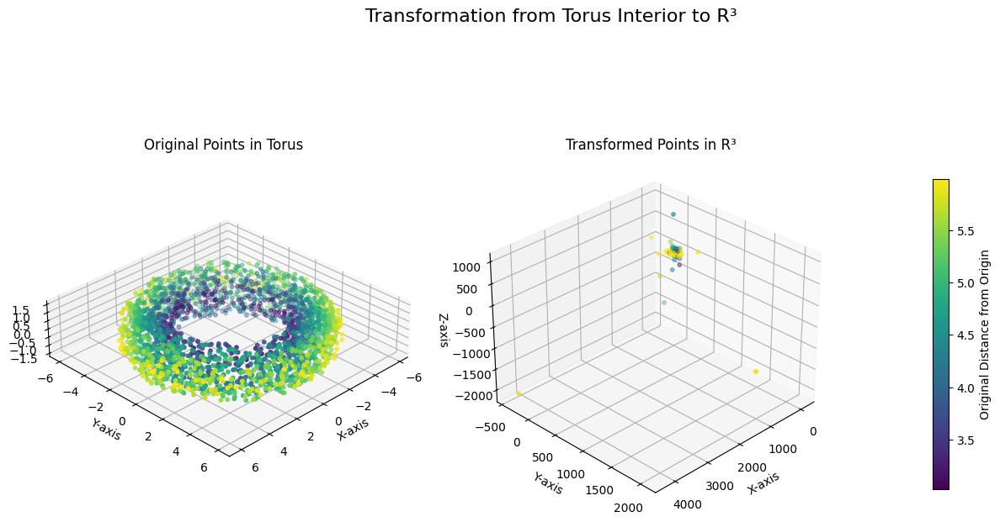

In [2]:

import numpy as np
import matplotlib.pyplot as plt

def map_torus_to_r3(point, inner_radius_a, outer_radius_b):
    """
    Maps a point from the interior of a torus to R^3.
    (This is the same function as in the previous example)
    """
    x, y, z = point
    R = (inner_radius_a + outer_radius_b) / 2.0
    r = (outer_radius_b - inner_radius_a) / 2.0

    r_xy = np.sqrt(x**2 + y**2)
    if r_xy == 0:
        C = np.array([R, 0, 0])
    else:
        C = np.array([R * x / r_xy, R * y / r_xy, 0])

    P = np.array([x, y, z])
    V = P - C
    s = np.linalg.norm(V)

    if s == 0:
        return P

    # Check if point is outside the torus interior
    if s >= r:
        # For visualization purposes, return a NaN array for points outside the boundary
        return np.array([np.nan, np.nan, np.nan])

    s_prime = np.tan((np.pi / 2) * (s / r))
    P_prime = C + s_prime * (V / s)

    return P_prime

def generate_torus_points(num_points, inner_radius_a, outer_radius_b):
    """Generates random points uniformly distributed inside a torus."""
    R = (inner_radius_a + outer_radius_b) / 2.0
    r = (outer_radius_b - inner_radius_a) / 2.0
    
    points = []
    while len(points) < num_points:
        # Generate points in a bounding box and reject those outside the torus
        x = np.random.uniform(-(R + r), R + r)
        y = np.random.uniform(-(R + r), R + r)
        z = np.random.uniform(-r, r)
        
        # Check if the point is inside the torus
        s = np.sqrt((np.sqrt(x**2 + y**2) - R)**2 + z**2)
        if s < r:
            points.append([x, y, z])
            
    return np.array(points)

# --- Main Execution ---

# 1. Define Torus Geometry and Number of Points
a = 3.0  # Inner radius
b = 6.0  # Outer radius
num_points = 2500

# 2. Generate Original Points
original_points = generate_torus_points(num_points, a, b)

# 3. Transform the Points
transformed_points = np.array([map_torus_to_r3(p, a, b) for p in original_points])

# Use the radial distance for coloring to see the expansion
radial_distance = np.sqrt(original_points[:,0]**2 + original_points[:,1]**2 + original_points[:,2]**2)

# 4. Create the Plots
fig = plt.figure(figsize=(16, 8))

# --- First Plot: Original Torus Points ---
ax1 = fig.add_subplot(121, projection='3d')
scatter1 = ax1.scatter(original_points[:, 0], original_points[:, 1], original_points[:, 2],
                       c=radial_distance, cmap='viridis', s=10)
ax1.set_title('Original Points in Torus')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Y-axis')
ax1.set_zlabel('Z-axis')
ax1.view_init(elev=30, azim=45) # Set a good viewing angle
ax1.set_aspect('equal', 'box') # Enforce equal scaling

# --- Second Plot: Transformed R3 Points ---
ax2 = fig.add_subplot(122, projection='3d')
scatter2 = ax2.scatter(transformed_points[:, 0], transformed_points[:, 1], transformed_points[:, 2],
                       c=radial_distance, cmap='viridis', s=10)
ax2.set_title('Transformed Points in R³')
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')
ax2.set_zlabel('Z-axis')
ax2.view_init(elev=30, azim=45)

# Add a color bar to relate colors to the original radial distance
cbar = fig.colorbar(scatter1, ax=[ax1, ax2], shrink=0.6, pad=0.1)
cbar.set_label('Original Distance from Origin')


plt.suptitle('Transformation from Torus Interior to R³', fontsize=16)
plt.show()

In [5]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def map_torus_to_r3(point, inner_radius_a, outer_radius_b):
    """
    Maps a point from the interior of a torus to R^3.
    (This is the same function as in the previous examples)
    """
    x, y, z = point
    R = (inner_radius_a + outer_radius_b) / 2.0
    r = (outer_radius_b - inner_radius_a) / 2.0

    r_xy = np.sqrt(x**2 + y**2)
    if r_xy == 0:
        C = np.array([R, 0, 0])
    else:
        C = np.array([R * x / r_xy, R * y / r_xy, 0])

    P = np.array([x, y, z])
    V = P - C
    s = np.linalg.norm(V)

    if s == 0:
        return P

    # If point is on or outside the boundary, it maps to infinity.
    # We will exclude these points from the plot for practical visualization.
    if s >= r:
        return np.array([np.nan, np.nan, np.nan])

    s_prime = np.tan((np.pi / 2) * (s / r))
    P_prime = C + s_prime * (V / s)

    return P_prime

def generate_torus_points(num_points, inner_radius_a, outer_radius_b):
    """Generates random points uniformly distributed inside a torus."""
    R = (inner_radius_a + outer_radius_b) / 2.0
    r = (outer_radius_b - inner_radius_a) / 2.0
    
    points = []
    while len(points) < num_points:
        # Generate points in a bounding box and reject those outside the torus
        x = np.random.uniform(-(R + r), R + r)
        y = np.random.uniform(-(R + r), R + r)
        z = np.random.uniform(-r, r)
        
        # Check if the point is inside the torus
        s = np.sqrt((np.sqrt(x**2 + y**2) - R)**2 + z**2)
        if s < r:
            points.append([x, y, z])
            
    return np.array(points)

# --- Main Execution ---

# 1. Define Torus Geometry and Number of Points
a = 3.0  # Inner radius
b = 6.0  # Outer radius
num_points = 3000

# 2. Generate Original Points
original_points = generate_torus_points(num_points, a, b)

# 3. Transform the Points
transformed_points = np.array([map_torus_to_r3(p, a, b) for p in original_points])

# Use the distance from the central circle (s) for coloring to better show the expansion
R_major = (a + b) / 2.0
s_distances = np.sqrt((np.sqrt(original_points[:,0]**2 + original_points[:,1]**2) - R_major)**2 + original_points[:,2]**2)
cond = s_distances < 1
print(cond.sum())
# 4. Create the Plotly Figure
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=('Original Points in Torus', 'Transformed Points in R³')
)

# --- First Plot: Original Torus Points ---
fig.add_trace(
    go.Scatter3d(
        x=original_points[:, 0],
        y=original_points[:, 1],
        z=original_points[:, 2],
        mode='markers',
        marker=dict(
            size=2,
            color=s_distances,  # Color by distance from the central axis
            colorscale='Viridis',
            colorbar=dict(title='Distance from Center of Tube'),
            showscale=True
        )
    ),
    row=1, col=1
)

# --- Second Plot: Transformed R3 Points ---
fig.add_trace(
    go.Scatter3d(
        x=transformed_points[cond, 0],
        y=transformed_points[cond, 1],
        z=transformed_points[cond, 2],
        mode='markers',
        marker=dict(
            size=2,
            color=s_distances,  # Use the same color scale
            colorscale='Viridis',
            showscale=False # Color bar is already shown
        )
    ),
    row=1, col=2
)

# --- Update Layout and Scene Properties ---
fig.update_layout(
    title_text='Transformation from Torus Interior to R³',
    height=700,
    # Make the torus plot have a correct aspect ratio
    scene1=dict(
        xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
        aspectmode='data' # This ensures the torus is not distorted
    ),
    scene2=dict(
        xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
        aspectmode='auto' # The R3 plot can auto-scale
    )
)

fig.show()

1308


In [7]:
import numpy as np

def map_r3_to_torus(point_r3, inner_radius_a, outer_radius_b):
    """
    Maps a point from R^3 to the interior of a torus.

    This is the inverse of the map_torus_to_r3 function.

    Args:
        point_r3 (tuple or list): The (x', y', z') coordinates of the point in R^3.
        inner_radius_a (float): The inner radius of the target torus.
        outer_radius_b (float): The outer radius of the target torus.

    Returns:
        numpy.ndarray: The transformed (x, y, z) coordinates inside the torus.
    """
    x_prime, y_prime, z_prime = point_r3

    # 1. Calculate the major and minor radii of the torus
    R = (inner_radius_a + outer_radius_b) / 2.0
    r = (outer_radius_b - inner_radius_a) / 2.0

    # Handle the case where the point is on the z-axis to avoid division by zero
    r_xy_prime = np.sqrt(x_prime**2 + y_prime**2)
    if r_xy_prime == 0:
        # For a point on the z-axis, the closest point on the central circle can be (R, 0, 0)
        C = np.array([R, 0, 0])
    else:
        # 2. Find the corresponding point C on the central circle
        C = np.array([R * x_prime / r_xy_prime, R * y_prime / r_xy_prime, 0])

    # 3. Determine the position vector V' relative to the central circle
    P_prime = np.array([x_prime, y_prime, z_prime])
    V_prime = P_prime - C

    # 4. Calculate the distance 's_prime' from the central circle
    s_prime = np.linalg.norm(V_prime)

    # If the point is already on the central circle, it maps to itself.
    if s_prime == 0:
        return P_prime

    # 5. Apply the inverse scaling function (arctangent) to get the compressed distance 's'
    s = (2 * r / np.pi) * np.arctan(s_prime)

    # 6. Construct the transformed point P inside the torus
    # The new point is found by moving from C by the compressed distance 's'
    # in the same direction as V'.
    P = C + s * (V_prime / s_prime)

    return P

# --- Example Usage ---

# Define the target torus geometry
a = 2.0  # Inner radius
b = 4.0  # Outer radius

# This gives a major radius R of 3.0 and a minor radius r of 1.0.

# --- Example 1: A point moderately far away ---
# This is the result from the forward transformation example
point_in_r3_1 = (4.0, 0, 0)

# Apply the inverse transformation
point_in_torus_1 = map_r3_to_torus(point_in_r3_1, a, b)

print("--- Example 1 ---")
print(f"Original point in R³: {point_in_r3_1}")
print(f"Transformed point in Torus: {np.round(point_in_torus_1, 5)}")
print("-" * 25)

# --- Example 2: A point very far away ---
point_in_r3_2 = (100.0, -50.0, 75.0)

point_in_torus_2 = map_r3_to_torus(point_in_r3_2, a, b)

print("--- Example 2 ---")
print(f"Original point in R³: {point_in_r3_2}")
print(f"Transformed point in Torus: {np.round(point_in_torus_2, 5)}")
print("-" * 25)

# --- Example 3: A point that was originally near the torus boundary ---
# In the forward transform, a point at (3.99, 0, 0) was mapped to a large value.
# Let's use that large value as input here to see if we get back to the original point.
point_from_forward_transform = (66.6583, 0, 0) # A point far out on the x-axis

point_in_torus_3 = map_r3_to_torus(point_from_forward_transform, a, b)

print("--- Example 3: Verifying the inverse ---")
print(f"Original point in R³: {point_from_forward_transform}")
print(f"Transformed point in Torus: {np.round(point_in_torus_3, 5)}")
print("Note: This is very close to the original (3.99, 0, 0) before the forward transform.")
print("-" * 25)

# --- Example 4: A point on the z-axis ---
point_on_z_axis = (0, 0, 50.0)

point_in_torus_4 = map_r3_to_torus(point_on_z_axis, a, b)
print("--- Example 4 ---")
print(f"Original point in R³: {point_on_z_axis}")


--- Example 1 ---
Original point in R³: (4.0, 0, 0)
Transformed point in Torus: [3.5 0.  0. ]
-------------------------
--- Example 2 ---
Original point in R³: (100.0, -50.0, 75.0)
Transformed point in Torus: [ 3.41615 -1.70808  0.56481]
-------------------------
--- Example 3: Verifying the inverse ---
Original point in R³: (66.6583, 0, 0)
Transformed point in Torus: [3.99 0.   0.  ]
Note: This is very close to the original (3.99, 0, 0) before the forward transform.
-------------------------
--- Example 4 ---
Original point in R³: (0, 0, 50.0)


In [ ]:
map_r3_to_torus([0,0,0], 1, 2)

array([1.18716704, 0.        , 0.        ])

In [9]:
map_r3_to_torus([-1,-1,-1], 1, 2)

array([-1.04551536, -1.04551536, -0.24966649])

In [16]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import numpy as np

# Set random seed for reproducibility
np.random.seed(42)

# Generate random points in R³ (both positive and negative coordinates)
n_points = 10000
x_original = np.random.uniform(-10, 10, n_points)
y_original = np.random.uniform(-10, 10, n_points)
z_original = np.random.uniform(-10, 10, n_points)

print(f"Generated {n_points} random points in R³")
print(f"X range: [{x_original.min():.2f}, {x_original.max():.2f}]")
print(f"Y range: [{y_original.min():.2f}, {y_original.max():.2f}]")
print(f"Z range: [{z_original.min():.2f}, {z_original.max():.2f}]")


Generated 10000 random points in R³
X range: [-10.00, 9.99]
Y range: [-10.00, 10.00]
Z range: [-10.00, 10.00]


In [31]:
# Define torus parameters
#inner_radius_a = 1.0
#outer_radius_b = 3.0

inner_radius_a = 1.8980918419589048
outer_radius_b = 9.110752064481275


# Apply the map_r3_to_torus transformation to all points
x_transformed = []
y_transformed = []
z_transformed = []

print("Applying map_r3_to_torus transformation...")
for i in range(n_points):
    point_r3 = [x_original[i], y_original[i], z_original[i]]
    transformed_point = map_r3_to_torus(point_r3, inner_radius_a, outer_radius_b)
    x_transformed.append(transformed_point[0])
    y_transformed.append(transformed_point[1])
    z_transformed.append(transformed_point[2])

x_transformed = np.array(x_transformed)
y_transformed = np.array(y_transformed)
z_transformed = np.array(z_transformed)

print(f"Transformation complete!")
print(f"Transformed X range: [{x_transformed.min():.3f}, {x_transformed.max():.3f}]")
print(f"Transformed Y range: [{y_transformed.min():.3f}, {y_transformed.max():.3f}]")
print(f"Transformed Z range: [{z_transformed.min():.3f}, {z_transformed.max():.3f}]")


Applying map_r3_to_torus transformation...
Transformation complete!
Transformed X range: [-8.565, 8.567]
Transformed Y range: [-8.553, 8.557]
Transformed Z range: [-3.376, 3.377]


In [32]:
# Create the 3D scatter plot
fig = go.Figure()

# Add original points (in R³)
fig.add_trace(go.Scatter3d(
    x=x_original,
    y=y_original,
    z=z_original,
    mode='markers',
    marker=dict(
        size=3,
        color='red',
        opacity=0.6
    ),
    name='Original Points (R³)',
    text=[f'Original: ({x_original[i]:.2f}, {y_original[i]:.2f}, {z_original[i]:.2f})' 
          for i in range(n_points)],
    hovertemplate='%{text}<br>X: %{x:.2f}<br>Y: %{y:.2f}<br>Z: %{z:.2f}<extra></extra>'
))

# Add transformed points (in torus)
fig.add_trace(go.Scatter3d(
    x=x_transformed,
    y=y_transformed,
    z=z_transformed,
    mode='markers',
    marker=dict(
        size=3,
        color='blue',
        opacity=0.6
    ),
    name='Transformed Points (Torus)',
    text=[f'Transformed: ({x_transformed[i]:.3f}, {y_transformed[i]:.3f}, {z_transformed[i]:.3f})' 
          for i in range(n_points)],
    hovertemplate='%{text}<br>X: %{x:.3f}<br>Y: %{y:.3f}<br>Z: %{z:.3f}<extra></extra>'
))

# Update layout
fig.update_layout(
    title='3D Scatter Plot: Random Points in R³ and Their Torus Transformations',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.5)
        )
    ),
    width=1000,
    height=800,
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)

fig.show()


In [33]:
# Create side-by-side comparison
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=('Original Points in R³', 'Transformed Points in Torus'),
    horizontal_spacing=0.1
)

# Original points
fig.add_trace(
    go.Scatter3d(
        x=x_original,
        y=y_original,
        z=z_original,
        mode='markers',
        marker=dict(size=2, color='red', opacity=0.7),
        name='Original',
        showlegend=False
    ),
    row=1, col=1
)

# Transformed points
fig.add_trace(
    go.Scatter3d(
        x=x_transformed,
        y=y_transformed,
        z=z_transformed,
        mode='markers',
        marker=dict(size=2, color='blue', opacity=0.7),
        name='Transformed',
        showlegend=False
    ),
    row=1, col=2
)

# Update layout for side-by-side view
fig.update_layout(
    title='Side-by-Side Comparison: Original vs Transformed Points',
    width=1200,
    height=600,
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    scene2=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    )
)

fig.show()


In [34]:
# Statistical analysis
print("=== STATISTICAL ANALYSIS ===")
print(f"Torus parameters: inner_radius = {inner_radius_a}, outer_radius = {outer_radius_b}")
print(f"Major radius R = {(inner_radius_a + outer_radius_b) / 2:.2f}")
print(f"Minor radius r = {(outer_radius_b - inner_radius_a) / 2:.2f}")
print()

print("Original points (R³):")
print(f"  Mean: ({x_original.mean():.3f}, {y_original.mean():.3f}, {z_original.mean():.3f})")
print(f"  Std:  ({x_original.std():.3f}, {y_original.std():.3f}, {z_original.std():.3f})")
print(f"  Range: X∈[{x_original.min():.2f}, {x_original.max():.2f}], Y∈[{y_original.min():.2f}, {y_original.max():.2f}], Z∈[{z_original.min():.2f}, {z_original.max():.2f}]")
print()

print("Transformed points (Torus):")
print(f"  Mean: ({x_transformed.mean():.3f}, {y_transformed.mean():.3f}, {z_transformed.mean():.3f})")
print(f"  Std:  ({x_transformed.std():.3f}, {y_transformed.std():.3f}, {z_transformed.std():.3f})")
print(f"  Range: X∈[{x_transformed.min():.3f}, {x_transformed.max():.3f}], Y∈[{y_transformed.min():.3f}, {y_transformed.max():.3f}], Z∈[{z_transformed.min():.3f}, {z_transformed.max():.3f}]")
print()

# Calculate distances from origin
dist_original = np.sqrt(x_original**2 + y_original**2 + z_original**2)
dist_transformed = np.sqrt(x_transformed**2 + y_transformed**2 + z_transformed**2)

print("Distance from origin:")
print(f"  Original: mean={dist_original.mean():.2f}, std={dist_original.std():.2f}, max={dist_original.max():.2f}")
print(f"  Transformed: mean={dist_transformed.mean():.2f}, std={dist_transformed.std():.2f}, max={dist_transformed.max():.2f}")
print()

# Check if points are within torus bounds
R = (inner_radius_a + outer_radius_b) / 2.0
r = (outer_radius_b - inner_radius_a) / 2.0

# For each transformed point, check if it's within the torus
points_in_torus = 0
for i in range(n_points):
    x, y, z = x_transformed[i], y_transformed[i], z_transformed[i]
    # Distance from z-axis
    r_xy = np.sqrt(x**2 + y**2)
    # Distance from the central circle
    distance_from_central_circle = np.sqrt((r_xy - R)**2 + z**2)
    if distance_from_central_circle <= r:
        points_in_torus += 1

print(f"Points within torus bounds: {points_in_torus}/{n_points} ({100*points_in_torus/n_points:.1f}%)")


=== STATISTICAL ANALYSIS ===
Torus parameters: inner_radius = 1.8980918419589048, outer_radius = 9.110752064481275
Major radius R = 5.50
Minor radius r = 3.61

Original points (R³):
  Mean: (-0.117, 0.091, 0.001)
  Std:  (5.752, 5.786, 5.735)
  Range: X∈[-10.00, 9.99], Y∈[-10.00, 10.00], Z∈[-10.00, 10.00]

Transformed points (Torus):
  Mean: (-0.091, 0.075, 0.004)
  Std:  (4.749, 4.775, 2.552)
  Range: X∈[-8.565, 8.567], Y∈[-8.553, 8.557], Z∈[-3.376, 3.377]

Distance from origin:
  Original: mean=9.58, std=2.79, max=16.39
  Transformed: mean=7.07, std=1.36, max=8.84

Points within torus bounds: 10000/10000 (100.0%)


In [35]:
# Advanced visualization with color coding based on distance from origin
fig = go.Figure()

# Add original points with color based on distance from origin
fig.add_trace(go.Scatter3d(
    x=x_original,
    y=y_original,
    z=z_original,
    mode='markers',
    marker=dict(
        size=3,
        color=dist_original,
        colorscale='Reds',
        colorbar=dict(title="Distance from Origin", x=0.02),
        opacity=0.7
    ),
    name='Original Points (R³)',
    text=[f'Original: ({x_original[i]:.2f}, {y_original[i]:.2f}, {z_original[i]:.2f})<br>Distance: {dist_original[i]:.2f}' 
          for i in range(n_points)],
    hovertemplate='%{text}<extra></extra>'
))

# Add transformed points with color based on distance from origin
fig.add_trace(go.Scatter3d(
    x=x_transformed,
    y=y_transformed,
    z=z_transformed,
    mode='markers',
    marker=dict(
        size=3,
        color=dist_transformed,
        colorscale='Blues',
        colorbar=dict(title="Distance from Origin", x=0.98),
        opacity=0.7
    ),
    name='Transformed Points (Torus)',
    text=[f'Transformed: ({x_transformed[i]:.3f}, {y_transformed[i]:.3f}, {z_transformed[i]:.3f})<br>Distance: {dist_transformed[i]:.3f}' 
          for i in range(n_points)],
    hovertemplate='%{text}<extra></extra>'
))

# Update layout
fig.update_layout(
    title='3D Scatter Plot: Random Points with Distance-Based Color Coding<br>' +
          f'<sub>Red points: Original R³ points | Blue points: Transformed torus points | ' +
          f'Torus: R={R:.1f}, r={r:.1f}</sub>',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.5)
        )
    ),
    width=1200,
    height=800,
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)

fig.show()


In [43]:
# =============================================================================
# GAUSSIAN NORMAL DISTRIBUTION ANALYSIS
# =============================================================================

def generate_gaussian_points(n_points, std_deviation=2.0, center=(0, 0, 0)):
    """
    Generate points using Gaussian normal distribution.
    
    Args:
        n_points (int): Number of points to generate
        std_deviation (float): Standard deviation for the Gaussian distribution
        center (tuple): Center point (x, y, z) for the distribution
    
    Returns:
        tuple: (x, y, z) arrays of generated points
    """
    cx, cy, cz = center
    
    # Generate points using normal distribution
    x_gaussian = np.random.normal(cx, std_deviation, n_points)
    y_gaussian = np.random.normal(cy, std_deviation, n_points)
    z_gaussian = np.random.normal(cz, std_deviation, n_points)
    
    return x_gaussian, y_gaussian, z_gaussian

# Generate Gaussian points with standard deviation of 2
n_points_gaussian = 10000
std_dev = 10.0
x_gaussian = np.random.normal(0, std_dev, n_points_gaussian)
y_gaussian = np.random.normal(0, std_dev, n_points_gaussian)
z_gaussian = np.random.normal(0, std_dev, n_points_gaussian)

print(f"Generated {n_points_gaussian} points using Gaussian normal distribution")
print(f"Standard deviation: {std_dev}")
print(f"X range: [{x_gaussian.min():.2f}, {x_gaussian.max():.2f}]")
print(f"Y range: [{y_gaussian.min():.2f}, {y_gaussian.max():.2f}]")
print(f"Z range: [{z_gaussian.min():.2f}, {z_gaussian.max():.2f}]")
print(f"X mean: {x_gaussian.mean():.3f}, std: {x_gaussian.std():.3f}")
print(f"Y mean: {y_gaussian.mean():.3f}, std: {y_gaussian.std():.3f}")
print(f"Z mean: {z_gaussian.mean():.3f}, std: {z_gaussian.std():.3f}")


Generated 10000 points using Gaussian normal distribution
Standard deviation: 10.0
X range: [-37.05, 38.30]
Y range: [-36.27, 36.00]
Z range: [-37.83, 42.02]
X mean: 0.030, std: 9.953
Y mean: -0.061, std: 9.944
Z mean: 0.119, std: 10.010


In [44]:
# Apply the map_r3_to_torus transformation to Gaussian points
x_gaussian_transformed = []
y_gaussian_transformed = []
z_gaussian_transformed = []

print("Applying map_r3_to_torus transformation to Gaussian points...")
for i in range(n_points_gaussian):
    point_r3 = [x_gaussian[i], y_gaussian[i], z_gaussian[i]]
    transformed_point = map_r3_to_torus(point_r3, inner_radius_a, outer_radius_b)
    x_gaussian_transformed.append(transformed_point[0])
    y_gaussian_transformed.append(transformed_point[1])
    z_gaussian_transformed.append(transformed_point[2])

x_gaussian_transformed = np.array(x_gaussian_transformed)
y_gaussian_transformed = np.array(y_gaussian_transformed)
z_gaussian_transformed = np.array(z_gaussian_transformed)

print(f"Gaussian transformation complete!")
print(f"Transformed X range: [{x_gaussian_transformed.min():.3f}, {x_gaussian_transformed.max():.3f}]")
print(f"Transformed Y range: [{y_gaussian_transformed.min():.3f}, {y_gaussian_transformed.max():.3f}]")
print(f"Transformed Z range: [{z_gaussian_transformed.min():.3f}, {z_gaussian_transformed.max():.3f}]")


Applying map_r3_to_torus transformation to Gaussian points...
Gaussian transformation complete!
Transformed X range: [-8.994, 9.011]
Transformed Y range: [-9.002, 8.990]
Transformed Z range: [-3.545, 3.535]


In [45]:
inner_radius_a, outer_radius_b

(1.8980918419589048, 9.110752064481275)

In [46]:
# Create 3D scatter plot for Gaussian points
fig_gaussian = go.Figure()

# Add original Gaussian points (in R³)
fig_gaussian.add_trace(go.Scatter3d(
    x=x_gaussian,
    y=y_gaussian,
    z=z_gaussian,
    mode='markers',
    marker=dict(
        size=3,
        color='green',
        opacity=0.6
    ),
    name='Original Gaussian Points (R³)',
    text=[f'Original: ({x_gaussian[i]:.2f}, {y_gaussian[i]:.2f}, {z_gaussian[i]:.2f})' 
          for i in range(n_points_gaussian)],
    hovertemplate='%{text}<br>X: %{x:.2f}<br>Y: %{y:.2f}<br>Z: %{z:.2f}<extra></extra>'
))

# Add transformed Gaussian points (in torus)
fig_gaussian.add_trace(go.Scatter3d(
    x=x_gaussian_transformed,
    y=y_gaussian_transformed,
    z=z_gaussian_transformed,
    mode='markers',
    marker=dict(
        size=3,
        color='purple',
        opacity=0.6
    ),
    name='Transformed Gaussian Points (Torus)',
    text=[f'Transformed: ({x_gaussian_transformed[i]:.3f}, {y_gaussian_transformed[i]:.3f}, {z_gaussian_transformed[i]:.3f})' 
          for i in range(n_points_gaussian)],
    hovertemplate='%{text}<br>X: %{x:.3f}<br>Y: %{y:.3f}<br>Z: %{z:.3f}<extra></extra>'
))

# Update layout
fig_gaussian.update_layout(
    title='3D Scatter Plot: Gaussian Normal Points (σ=2) and Their Torus Transformations',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.5)
        )
    ),
    width=1000,
    height=800,
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)

fig_gaussian.show()


In [47]:
# Create side-by-side comparison for Gaussian points
fig_gaussian_compare = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=('Original Gaussian Points (R³)', 'Transformed Gaussian Points (Torus)'),
    horizontal_spacing=0.1
)

# Original Gaussian points
fig_gaussian_compare.add_trace(
    go.Scatter3d(
        x=x_gaussian,
        y=y_gaussian,
        z=z_gaussian,
        mode='markers',
        marker=dict(size=2, color='green', opacity=0.7),
        name='Original Gaussian',
        showlegend=False
    ),
    row=1, col=1
)

# Transformed Gaussian points
fig_gaussian_compare.add_trace(
    go.Scatter3d(
        x=x_gaussian_transformed,
        y=y_gaussian_transformed,
        z=z_gaussian_transformed,
        mode='markers',
        marker=dict(size=2, color='purple', opacity=0.7),
        name='Transformed Gaussian',
        showlegend=False
    ),
    row=1, col=2
)

# Update layout for side-by-side view
fig_gaussian_compare.update_layout(
    title=f'Side-by-Side Comparison: Gaussian Normal Distribution (σ={std_dev})',
    width=1200,
    height=600,
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    scene2=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    )
)

fig_gaussian_compare.show()


In [48]:
# Statistical analysis for Gaussian distribution
print("=== GAUSSIAN DISTRIBUTION STATISTICAL ANALYSIS ===")
print(f"Torus parameters: inner_radius = {inner_radius_a}, outer_radius = {outer_radius_b}")
print(f"Major radius R = {(inner_radius_a + outer_radius_b) / 2:.2f}")
print(f"Minor radius r = {(outer_radius_b - inner_radius_a) / 2:.2f}")
print(f"Gaussian standard deviation: σ = {std_dev}")
print()

print("Original Gaussian points (R³):")
print(f"  Mean: ({x_gaussian.mean():.3f}, {y_gaussian.mean():.3f}, {z_gaussian.mean():.3f})")
print(f"  Std:  ({x_gaussian.std():.3f}, {y_gaussian.std():.3f}, {z_gaussian.std():.3f})")
print(f"  Range: X∈[{x_gaussian.min():.2f}, {x_gaussian.max():.2f}], Y∈[{y_gaussian.min():.2f}, {y_gaussian.max():.2f}], Z∈[{z_gaussian.min():.2f}, {z_gaussian.max():.2f}]")
print()

print("Transformed Gaussian points (Torus):")
print(f"  Mean: ({x_gaussian_transformed.mean():.3f}, {y_gaussian_transformed.mean():.3f}, {z_gaussian_transformed.mean():.3f})")
print(f"  Std:  ({x_gaussian_transformed.std():.3f}, {y_gaussian_transformed.std():.3f}, {z_gaussian_transformed.std():.3f})")
print(f"  Range: X∈[{x_gaussian_transformed.min():.3f}, {x_gaussian_transformed.max():.3f}], Y∈[{y_gaussian_transformed.min():.3f}, {y_gaussian_transformed.max():.3f}], Z∈[{z_gaussian_transformed.min():.3f}, {z_gaussian_transformed.max():.3f}]")
print()

# Calculate distances from origin for Gaussian points
dist_gaussian_original = np.sqrt(x_gaussian**2 + y_gaussian**2 + z_gaussian**2)
dist_gaussian_transformed = np.sqrt(x_gaussian_transformed**2 + y_gaussian_transformed**2 + z_gaussian_transformed**2)

print("Distance from origin (Gaussian):")
print(f"  Original: mean={dist_gaussian_original.mean():.2f}, std={dist_gaussian_original.std():.2f}, max={dist_gaussian_original.max():.2f}")
print(f"  Transformed: mean={dist_gaussian_transformed.mean():.2f}, std={dist_gaussian_transformed.std():.2f}, max={dist_gaussian_transformed.max():.2f}")
print()

# Check if Gaussian transformed points are within torus bounds
R = (inner_radius_a + outer_radius_b) / 2.0
r = (outer_radius_b - inner_radius_a) / 2.0

points_in_torus_gaussian = 0
for i in range(n_points_gaussian):
    x, y, z = x_gaussian_transformed[i], y_gaussian_transformed[i], z_gaussian_transformed[i]
    # Distance from z-axis
    r_xy = np.sqrt(x**2 + y**2)
    # Distance from the central circle
    distance_from_central_circle = np.sqrt((r_xy - R)**2 + z**2)
    if distance_from_central_circle <= r:
        points_in_torus_gaussian += 1

print(f"Gaussian points within torus bounds: {points_in_torus_gaussian}/{n_points_gaussian} ({100*points_in_torus_gaussian/n_points_gaussian:.1f}%)")
print()

# Compare with uniform distribution
print("=== COMPARISON: UNIFORM vs GAUSSIAN ===")
print(f"Uniform points within torus: {points_in_torus}/{n_points} ({100*points_in_torus/n_points:.1f}%)")
print(f"Gaussian points within torus: {points_in_torus_gaussian}/{n_points_gaussian} ({100*points_in_torus_gaussian/n_points_gaussian:.1f}%)")
print()

# Distance statistics comparison
print("Distance statistics comparison:")
print(f"Uniform original: mean={dist_original.mean():.2f}, std={dist_original.std():.2f}")
print(f"Gaussian original: mean={dist_gaussian_original.mean():.2f}, std={dist_gaussian_original.std():.2f}")
print(f"Uniform transformed: mean={dist_transformed.mean():.2f}, std={dist_transformed.std():.2f}")
print(f"Gaussian transformed: mean={dist_gaussian_transformed.mean():.2f}, std={dist_gaussian_transformed.std():.2f}")


=== GAUSSIAN DISTRIBUTION STATISTICAL ANALYSIS ===
Torus parameters: inner_radius = 1.8980918419589048, outer_radius = 9.110752064481275
Major radius R = 5.50
Minor radius r = 3.61
Gaussian standard deviation: σ = 10.0

Original Gaussian points (R³):
  Mean: (0.030, -0.061, 0.119)
  Std:  (9.953, 9.944, 10.010)
  Range: X∈[-37.05, 38.30], Y∈[-36.27, 36.00], Z∈[-37.83, 42.02]

Transformed Gaussian points (Torus):
  Mean: (-0.011, 0.001, 0.023)
  Std:  (5.249, 5.242, 2.406)
  Range: X∈[-8.994, 9.011], Y∈[-9.002, 8.990], Z∈[-3.545, 3.535]

Distance from origin (Gaussian):
  Original: mean=15.90, std=6.75, max=47.32
  Transformed: mean=7.70, std=1.23, max=9.04

Gaussian points within torus bounds: 10000/10000 (100.0%)

=== COMPARISON: UNIFORM vs GAUSSIAN ===
Uniform points within torus: 10000/10000 (100.0%)
Gaussian points within torus: 10000/10000 (100.0%)

Distance statistics comparison:
Uniform original: mean=9.58, std=2.79
Gaussian original: mean=15.90, std=6.75
Uniform transformed: me

In [49]:
# Advanced comparison visualization with all four datasets
fig_comparison = go.Figure()

# Add uniform original points
fig_comparison.add_trace(go.Scatter3d(
    x=x_original,
    y=y_original,
    z=z_original,
    mode='markers',
    marker=dict(
        size=2,
        color='red',
        opacity=0.5
    ),
    name='Uniform Original (R³)',
    text=[f'Uniform Original: ({x_original[i]:.2f}, {y_original[i]:.2f}, {z_original[i]:.2f})' 
          for i in range(n_points)],
    hovertemplate='%{text}<extra></extra>'
))

# Add uniform transformed points
fig_comparison.add_trace(go.Scatter3d(
    x=x_transformed,
    y=y_transformed,
    z=z_transformed,
    mode='markers',
    marker=dict(
        size=2,
        color='blue',
        opacity=0.5
    ),
    name='Uniform Transformed (Torus)',
    text=[f'Uniform Transformed: ({x_transformed[i]:.3f}, {y_transformed[i]:.3f}, {z_transformed[i]:.3f})' 
          for i in range(n_points)],
    hovertemplate='%{text}<extra></extra>'
))

# Add Gaussian original points
fig_comparison.add_trace(go.Scatter3d(
    x=x_gaussian,
    y=y_gaussian,
    z=z_gaussian,
    mode='markers',
    marker=dict(
        size=2,
        color='green',
        opacity=0.5
    ),
    name='Gaussian Original (R³)',
    text=[f'Gaussian Original: ({x_gaussian[i]:.2f}, {y_gaussian[i]:.2f}, {z_gaussian[i]:.2f})' 
          for i in range(n_points_gaussian)],
    hovertemplate='%{text}<extra></extra>'
))

# Add Gaussian transformed points
fig_comparison.add_trace(go.Scatter3d(
    x=x_gaussian_transformed,
    y=y_gaussian_transformed,
    z=z_gaussian_transformed,
    mode='markers',
    marker=dict(
        size=2,
        color='purple',
        opacity=0.5
    ),
    name='Gaussian Transformed (Torus)',
    text=[f'Gaussian Transformed: ({x_gaussian_transformed[i]:.3f}, {y_gaussian_transformed[i]:.3f}, {z_gaussian_transformed[i]:.3f})' 
          for i in range(n_points_gaussian)],
    hovertemplate='%{text}<extra></extra>'
))

# Update layout
fig_comparison.update_layout(
    title='Complete Comparison: Uniform vs Gaussian Distributions<br>' +
          f'<sub>Red: Uniform Original | Blue: Uniform Transformed | Green: Gaussian Original (σ={std_dev}) | Purple: Gaussian Transformed</sub>',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.5)
        )
    ),
    width=1200,
    height=800,
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)

fig_comparison.show()
